In [1]:
### drugbank
import xml.etree.ElementTree
import copy
import numpy as np
from tqdm.auto import tqdm

def dictify(r, root=True, str_to_replace=''):
    if root:
        return {r.tag : dictify(r, root=False, str_to_replace=str_to_replace)}
    if r.findall("./*") == []:
        return r.text

    d=copy.copy(r.attrib)
    # if r.text:
    #     d["text"]=r.text
    for x in r.findall("./*"):
        if x.tag.replace(str_to_replace, '') not in d:
            d[x.tag.replace(str_to_replace, '')]=[]
        d[x.tag.replace(str_to_replace, '')].append(dictify(x, root=False, str_to_replace=str_to_replace))
    return d

with open('../data/drugbank_full_database.xml') as xml_file:
    tree = xml.etree.ElementTree.parse(xml_file)
root = tree.getroot()
print(len(root))

all_drug_dict = {}

for i, child in enumerate(tqdm(root)):
    d = dictify(child, root=False, str_to_replace='{http://www.drugbank.ca}')
    print(d)
    break


14594


  0%|          | 0/14594 [00:00<?, ?it/s]

{'type': 'biotech', 'created': '2005-06-13', 'updated': '2021-10-03', 'drugbank-id': ['DB00001', 'BTD00024', 'BIOD00024'], 'name': ['Lepirudin'], 'description': ['Lepirudin is identical to natural hirudin except for substitution of leucine for isoleucine at the N-terminal end of the molecule and the absence of a sulfate group on the tyrosine at position 63. It is produced via yeast cells. Bayer ceased the production of lepirudin (Refludan) effective May 31, 2012.'], 'cas-number': ['138068-37-8'], 'unii': ['Y43GF64R34'], 'state': ['liquid'], 'groups': [{'group': ['approved']}], 'general-references': [{'articles': [{'article': [{'ref-id': ['A1'], 'pubmed-id': ['16244762'], 'citation': ['Smythe MA, Stephens JL, Koerber JM, Mattson JC: A comparison of lepirudin and argatroban outcomes. Clin Appl Thromb Hemost. 2005 Oct;11(4):371-4.']}, {'ref-id': ['A2'], 'pubmed-id': ['16690967'], 'citation': ['Tardy B, Lecompte T, Boelhen F, Tardy-Poncet B, Elalamy I, Morange P, Gruel Y, Wolf M, Francois 

In [ ]:
### Process Drugs
import importlib
import parse_xml
importlib.reload(parse_xml)

with open('../data/drugbank_full_database.xml') as xml_file:
    tree = xml.etree.ElementTree.parse(xml_file)
root = tree.getroot()
print(len(root))

# all_targets = []
# print(len([_ for targets in all_targets for _ in targets ])) # 18703
# lens = [len(targets) for targets in all_targets]
# print(np.mean(lens), np.min(lens), np.max(lens)) # 1.2815540633136906 0 300
all_drug_dict = {}

for i, child in enumerate(tqdm(root)):
    d = parse_xml.dictify(child, root=False, str_to_replace='{http://www.drugbank.ca}')

    # # checking for date consistency (it is)
    # if d['created'][4] != '-' or d['created'][7] != '-': print(d['created'])
    ## Check num targets
    # if len(d['targets']) > 1: print('Drug:', d['name'], 'target:', d['targets'][0]['target'][0]['name'])
    
    # if d['name'][0] != 'Adalimumab':
    #     continue
    # else:

    d = parse_xml.parse_drug_dict(d)
    all_drug_dict[d['name']] = d

# pickle.dump(all_drug_dict, open('all_drug_dict.pkl', 'wb'))

In [ ]:
# key = list(all_drug_dict.keys())[0]
# print(all_drug_dict[key].keys())

# for k in all_drug_dict[key].keys():
#     print('=======================')
#     print(k,':', all_drug_dict[key][k])
# # all_types = [all_drug_dict[key]['type'] for key in all_drug_dict.keys()]
# # print(np.unique(all_types))
# # all_states = [all_drug_dict[key]['state'] for key in all_drug_dict.keys()]
# # print(np.unique(all_states, return_counts=True))


In [ ]:
# ### analyzing the dosages, types of forms and routes: Could be used in statistics all_routes, ignore

# all_dosages = [d['dosages'] for d in all_drug_dicts]
# # print(all_dosages[0])
# all_forms = []
# all_routes = []
# all_strengths = []

# for dosage_list in all_dosages:
#     for dosage in dosage_list:
#         forms = dosage['form'][0]
#         routes = dosage['route'][0]
#         strengths = dosage['strength'][0]

#         if forms is None: forms = 'None'
#         if routes is None: routes = 'None'
#         if strengths is None: strengths = 'None'

#         all_forms.append([form.strip() for form in forms.replace(',',';').split(';')])
#         all_routes.append([route.strip() for route in routes.replace(',',';').split(';')])
#         all_strengths.append([strength.strip() for strength in strengths.replace(',',';').split(';')])

#         # print(forms)
#         # all_forms.append(forms)
#         # all_routes.append(routes)
#         # all_strengths.append([strength.strip() for strength in strengths.replace(',',';').split(';')])


# # all_forms = [dosage['form'][0] for dosage_list in all_dosages for dosage in dosage_list]
# # all_routes = [dosage['route'][0] for dosage_list in all_dosages for dosage in dosage_list]
# # all_strengths = [dosage['strength'][0] for dosage_list in all_dosages for dosage in dosage_list]

# # all_forms = [_.replace(';',',').split(',') if _ is not None else ['None'] for _ in all_forms]
# # all_routes = [_.replace(';',',').split(',') if _ is not None else ['None'] for _ in all_routes]
# # all_strengths = [_.replace(';',',').split(',') if _ is not None else ['None'] for _ in all_strengths]

# uniques, counts = np.unique(np.concatenate(all_routes), return_counts=True)
# print(len(uniques))
# for u,c in zip(uniques,counts):
#     print(u,c)


In [3]:
import pickle
drug_dict = pickle.load(open('all_drug_dict2.pkl', 'rb'))
drug_dict

{'Lepirudin': {'type': 'biotech',
  'created': 35.471803652968035,
  'name': 'Lepirudin',
  'description': 'Lepirudin is identical to natural hirudin except for substitution of leucine for isoleucine at the N-terminal end of the molecule and the absence of a sulfate group on the tyrosine at position 63. It is produced via yeast cells. Bayer ceased the production of lepirudin (Refludan) effective May 31, 2012.',
  'state': 'liquid',
  'indication': 'For the treatment of heparin-induced thrombocytopenia',
  'pharmacodynamics': 'Lepirudin is used to break up clots and to reduce thrombocytopenia. It binds to thrombin and prevents thrombus or clot formation. It is a highly potent, selective, and essentially irreversible inhibitor of thrombin and clot-bond thrombin. Lepirudin requires no cofactor for its anticoagulant action. Lepirudin is a recombinant form of hirudin, an endogenous anticoagulant found in medicinal leeches.',
  'mechanism-of-action': 'Lepirudin forms a stable non-covalent co

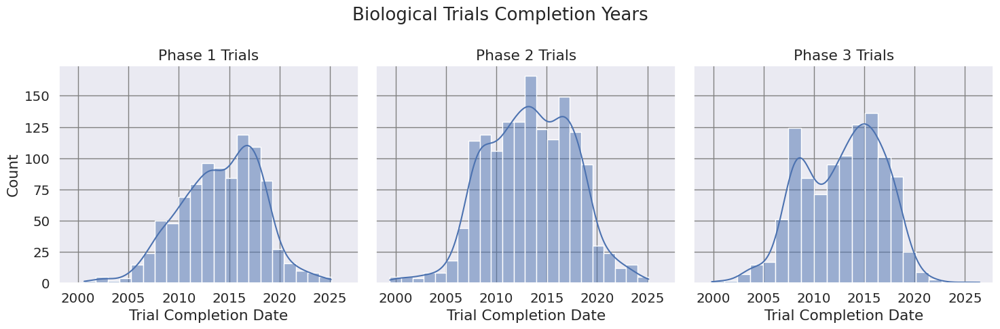

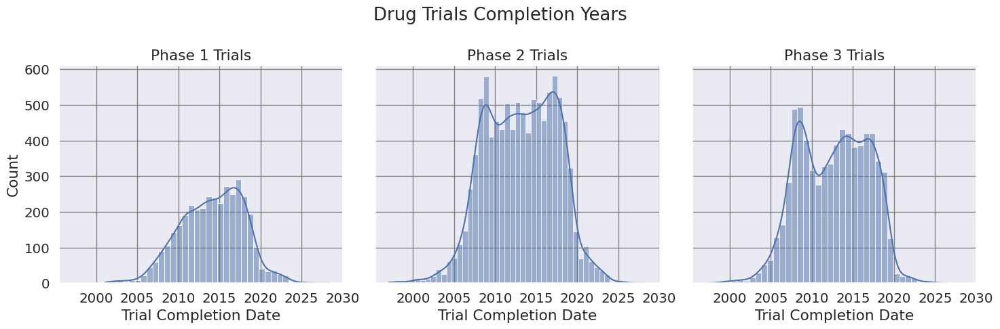

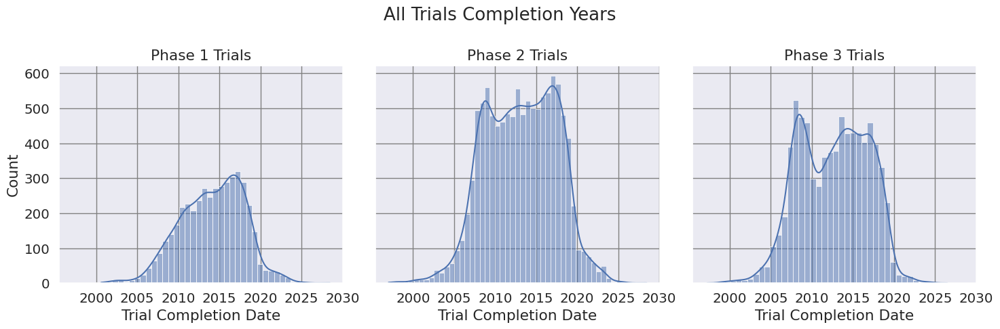

In [1]:
# =================== Visualize trial completion dates ===================
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(font_scale=1.3)
    
for train_mode_ind, train_mode in enumerate(['Biological', 'Drug', 'All']):
    fig, axs = plt.subplots(ncols=3, sharey=True, sharex=True, figsize=(15,5))
    fig.suptitle('Vertically stacked subplots')
    for phase_ind, phase in enumerate(['1','2','3']):
        all_valid_trials = pickle.load(open('all_valid_trials2.pkl', 'rb'))
        if train_mode == 'Biological':
            all_valid_trials = [trial for trial in all_valid_trials 
                if 'phase '+phase in trial['phase'].lower() and 'Biological' in trial['intervention_types']
            ]
        elif train_mode == 'Drug':
            all_valid_trials = [trial for trial in all_valid_trials 
                if 'phase '+phase in trial['phase'].lower() and 'Drug' in trial['intervention_types']
            ]
        else: # args.train_mode == 'both
            all_valid_trials = [trial for trial in all_valid_trials 
                if 'phase '+phase in trial['phase'].lower() and ('Drug' in trial['intervention_types'] or 'Biological' in trial['intervention_types'])
            ]

        years = [trial['completion_date']+1970 for trial in all_valid_trials]
        sns.histplot(years, kde=True, ax=axs[phase_ind])
        axs[phase_ind].set(title='Phase {} Trials'.format(phase))
        axs[phase_ind].set(xlabel='Trial Completion Date')
        axs[phase_ind].grid(visible=True, color='gray', linestyle='-')
    plt.suptitle('{} Trials Completion Years'.format(train_mode))
    plt.tight_layout()
    plt.savefig('test_imgs/{}_completion_year.pdf'.format(train_mode))

In [49]:
# =================== Visualize dataset statistics ===================
print("Mode, Phase, # Train (Label Ratio), # Test (Label Ratio)")

for train_mode in ['bio', 'drugs', 'both']:
    for phase in ['1','2','3']:
        all_valid_trials = pickle.load(open('all_valid_trials2.pkl', 'rb'))
        if train_mode == 'bio':
            
            all_valid_trials = [trial for trial in all_valid_trials 
                if 'phase '+phase in trial['phase'].lower() and \
                    'Biological' in trial['intervention_types']
            ]
        elif train_mode == 'drugs':
            all_valid_trials = [trial for trial in all_valid_trials 
                if 'phase '+phase in trial['phase'].lower() and \
                    'Drug' in trial['intervention_types']
            ]
        else: # args.train_mode == 'both
            all_valid_trials = [trial for trial in all_valid_trials 
                if 'phase '+phase in trial['phase'].lower() and \
                    ('Drug' in trial['intervention_types'] or 'Biological' in trial['intervention_types'])
            ]
        # print('len valid files after selecting phase {}:'.format(phase), len(all_valid_trials))

        year2split = 2015-1970 # convert to standard unix time
        test_trials = [trial for trial in all_valid_trials if trial['completion_date'] >= year2split]
        train_trials = [trial for trial in all_valid_trials if trial['completion_date'] < year2split]
        valid_trials = train_trials

        train_labels = [trial['label'] for trial in train_trials]
        test_labels = [trial['label'] for trial in test_trials]

        train_uniques, train_counts = np.unique(train_labels, return_counts=True)
        test_uniques, test_counts = np.unique(test_labels, return_counts=True)
        
        print("{}, {}, {} ({:.2f}%), {} ({:.2f}%)".format(train_mode, phase, \
            len(train_labels), train_counts[1]/len(train_labels)*100,\
            len(test_labels),test_counts[1]/len(test_labels)*100))



Mode, Phase, # Train (Label Ratio), # Test (Label Ratio)
bio, 1, 505 (71.29%), 441 (71.88%)
drugs, 1, 2032 (59.45%), 1681 (59.79%)
both, 1, 2418 (62.57%), 2019 (62.95%)


In [60]:
import pickle
import numpy as np

# var = [trial['sponsors'] for trial in all_valid_trials]
# print(np.unique(var, return_counts=True))
train_mode = 'bio'
save_path = './test_results/'
for phase in ['3']:
    all_valid_trials = pickle.load(open('all_valid_trials2.pkl', 'rb'))
    all_valid_trials = [trial for trial in all_valid_trials 
        if 'phase '+phase in trial['phase'].lower() and \
            # ('Drug' in trial['intervention_types'] or 'Biological' in trial['intervention_types'])
            'Biological' in trial['intervention_types']
    ]
    year2split = 2015-1970
    test_trials = [trial for trial in all_valid_trials if trial['completion_date'] >= year2split]

    train_preds = np.load(save_path+'phase_{}_mode_{}_valid_output.npy'.format(phase, train_mode))
    test_preds = np.load(save_path+'phase_{}_mode_{}_test_output.npy'.format(phase, train_mode))
    model_preds = np.concatenate([train_preds, test_preds])
    print(len(test_trials), len(test_preds))

    i = 8
    print(test_preds[i])
    for k, v in test_trials[i].items():
        print(k,v)
        print('='*10)

366 366
[ 0.7345874  -0.01137593]
id_info NCT00381680
brief_summary 
      This randomized phase III trial is studying low-dose vincristine to see how well it works
      compared with high-dose vincristine when given together with different combination
      chemotherapy regimens in treating young patients with intermediate-risk relapsed B-cell acute
      lymphoblastic leukemia. Drugs used in chemotherapy work in different ways to stop the growth
      of cancer cells, either by killing the cells or by stopping them from dividing. Giving more
      than one drug (combination chemotherapy) and giving the drugs in different ways and different
      doses may kill more cancer cells..
    
overall_status Completed
why_stopped []
phase phase 3
study_type Interventional
location_countries ['Other', 'North America', 'Europe', 'North America']
start_date 37.18698630136986
completion_date 46.195205479452056
intervention_types ['Drug', 'Drug', 'Drug', 'Drug', 'Drug', 'Drug', 'Drug', 'Drug', 'D

In [10]:
# import pickle
# import numpy as np

# all_trials, all_flags = pickle.load(open('all_trials_and_flags.pkl', 'rb'))

# print(len(all_flags)) 
## 426368
# print(np.unique(all_flags, return_counts=True)) 
## (array(['no-label', 'non-Biological or Drug', 'non-Interventional',
##     'success'], dtype='<U22'), array([149091, 155353,  96538,  25386]))